In [4]:
# Import libraries

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import numpy as np
from pylab import rcParams
import random
from datetime import datetime
plt.rcParams['figure.figsize'] = [45, 35]

# для моделирования воспользуемся sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
import plotly.graph_objs as go

import json
import requests
import pickle
from collections import Counter
%matplotlib inline

import datetime
from scipy.stats import spearmanr
import networkx as nx
from networkx.algorithms import community

In [2]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

Цель:
Перед вами не совсем стандартное домашнее задание, так как в нём практически не будет машинного обучения (если не считать анализа графов), но будет довольно много аналитики, симуляций, визуализаций и очень интересных выводов. Так как не совсем про ML, то и выполнять это задание не обязательно для успешного завершения курса. Но если вам интересно узнать, как можно смоделировать распространение инфекции по международной сети аэропортов, увидеть, как заражение аэропортов-хабов приводит к взрывному росту заболеваний и создать свой локальный Plague Inc., то давайте приступать :)

 Набор данных представляет собой основные маршруты авиаперелетов в США за один месяц 2008-го года.
 В качестве модели распространения инфекции предлагается использовать SI (susceptible-infected) модель,
 в которой каждый аэропорт имеет два возможных состояния - “здоровый” или “зараженный”.
 Здоровый аэропорт может заразиться с некоторой вероятностью p (infection probability), если к нему прилетает самолет из зараженного города.
 Инфекция начинает распространение из некоторого стартового аэропорта и заканчивает распространение, когда все перелеты из датасета завершены.

Часть 1. Пишем симуляцию.

Напишите функцию для симуляции одного прохода по всему датасету и распространения инфекции.
Функция должна принимать на вход стартовый город, в котором изначально началась инфекция и вероятность распространения инфекции p.
На выходе функция должна возвращать словарь, в котором ключом будет время заражения аэропорта, значением - название аэропорта.
В теле функции вам нужно написать проход по всему датасету (имеет смысл использовать itertuples),
где вы будете проверять, является ли текущий рейс “заразным” и если да - с вероятностью p заражать новый аэропорт.
В качестве стартовой ноды/аэропорта для симуляций можно использовать Allentown (node_id = 0).

Часть 2. Как инфекционность (вероятность заражения) болезни влияет на скорость распространения?

Давайте посмотрим, насколько заразной должна быть болезнь, чтобы заразить все аэропорты в сети.
Для каждой из вероятностей p=[0.01, 0.05, 0.1, 0.5, 1.] прогоните по 10 симуляций распространения, каждый раз сохраняя результаты.
Для каждых 12 часов симуляции посчитайте, какой средний процент аэропортов от общего их числа, был заражен к этому моменту времени.
Постройте графики числа зараженных городов в зависимости от времени для каждой из вероятностей.

Часть 3. Может ли информация о сети помочь предсказать, кто будет заражен?

Настало время поработать с NetworkX.
По имеющемуся датасету вам нужно построить ненаправленный граф всех аэропортов,
используя относительное число перелетов между соседними аэропортами в качестве веса ребра.
Например, если из аэропорта А в аэропорт Б суммарно есть 5 рейсов, из Б в А 10 рейсов, а всего в сети 150 перелетов,
то вес ребра между А и Б должен быть равен (5+10)/150 = 0.1.
Прогоните вашу симуляцию 50 раз, используя p=0.5 и стартовый аэропорт Allentown, каждый раз сохраняя результаты.
Используя данные симуляций посчитайте медианное время до заражения каждого города.
Теперь используя построенный вами граф, для каждого города посчитайте его коэффициент кластеризации (nx.clustering),
степень (nx.degree) и центральность (nx.betweenness_centrality).
Наконец, постройте scatter-plot-ы для медианного времени заражения и каждой из рассчитанных выше метрик.
Также посчитайте коэффициент корреляции Спирмана между этими показателями и попробуйте проинтерпретировать полученные результаты.
Какая из метрик графа сильнее всего скоррелирована со временем заражения? Почему?

# 「 Dataset Loading. 」

In [3]:
Raw_data = pd.read_csv('US_Flights_data_2008.zip') #https://www.kaggle.com/datasets/vikalpdongre/us-flights-data-2008

In [4]:
Raw_data.shape

(7009728, 29)

# 「 Часть 1. EDA 」

In [5]:
Raw_data

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2008,1,3,4,2003.000,1955,2211.000,2225,WN,335,...,4.000,8.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
1,2008,1,3,4,754.000,735,1002.000,1000,WN,3231,...,5.000,10.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
2,2008,1,3,4,628.000,620,804.000,750,WN,448,...,3.000,17.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
3,2008,1,3,4,926.000,930,1054.000,1100,WN,1746,...,3.000,7.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
4,2008,1,3,4,1829.000,1755,1959.000,1925,WN,3920,...,3.000,10.000,0,NaN,0,2.000,0.000,0.000,0.000,32.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7009723,2008,12,13,6,1002.000,959,1204.000,1150,DL,1636,...,6.000,45.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
7009724,2008,12,13,6,834.000,835,1021.000,1023,DL,1637,...,5.000,23.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
7009725,2008,12,13,6,655.000,700,856.000,856,DL,1638,...,24.000,12.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN
7009726,2008,12,13,6,1251.000,1240,1446.000,1437,DL,1639,...,13.000,13.000,0,NaN,0,NaN,NaN,NaN,NaN,NaN


In [6]:
Raw_data.isna().sum()

Year                       0
Month                      0
DayofMonth                 0
DayOfWeek                  0
DepTime               136246
CRSDepTime                 0
ArrTime               151649
CRSArrTime                 0
UniqueCarrier              0
FlightNum                  0
TailNum                83365
ActualElapsedTime     154699
CRSElapsedTime           844
AirTime               154699
ArrDelay              154699
DepDelay              136246
Origin                     0
Dest                       0
Distance                   0
TaxiIn                151649
TaxiOut               137058
Cancelled                  0
CancellationCode     6872294
Diverted                   0
CarrierDelay         5484993
WeatherDelay         5484993
NASDelay             5484993
SecurityDelay        5484993
LateAircraftDelay    5484993
dtype: int64

In [7]:
Raw_data.shape

(7009728, 29)

# 「 Lets change abbreviation to full airport name. 」

In [8]:
# список сокращённых и полных названий аэропортов
abbreviation = {'ATL': 'Atlanta'
                   ,'ORD': 'Chicago_OHare_International_Airport'
                   ,'DFW': 'Dallas'
                   ,'DEN': 'Denver'
                   ,'LAX': 'Los_Angeles'
                   ,'PHX': 'Phoenix'
                   ,'IAH': 'Houston_George_Bush_Intercontinental_Airport'
                   ,'LAS': 'Las_Vegas'
                   ,'DTW': 'Detroit'
                   ,'SFO': 'San_Francisco'
                   ,'SLC': 'Salt_Lake_City'
                   ,'EWR': 'Newark'
                   ,'MCO': 'Orlando'
                   ,'MSP': 'Minneapolis'
                   ,'CLT': 'Charlotte'
                   ,'LGA': 'New_York_LaGuardia_Airport'
                   ,'JFK': 'New_York_John_F_Kennedy_International_Airport'
                   ,'BOS': 'Boston'
                   ,'SEA': 'Seattle'
                   ,'BWI': 'Baltimore'
                   ,'PHL': 'Philadelphia'
                   ,'SAN': 'San_Diego'
                   ,'CVG': 'Cincinnati'
                   ,'MDW': 'Chicago_Midway_International_Airport'
                   ,'DCA': 'Washington_Ronald_Reagan_Washington_National_Airport'
                   ,'MEM': 'Memphis'
                   ,'TPA': 'Tampa'
                   ,'IAD': 'Washington_Dulles_International_Airport'
                   ,'FLL': 'Fort_Lauderdale'
                   ,'CLE': 'Cleveland'
                   ,'STL': 'St_Louis'
                   ,'MIA': 'Miami'
                   ,'OAK': 'Oakland'
                   ,'RDU': 'Raleigh_Durham'
                   ,'MCI': 'Kansas_City'
                   ,'PDX': 'Portland'
                   ,'BNA': 'Nashville'
                   ,'SJC': 'San_Jose'
                   ,'HNL': 'Honolulu'
                   ,'HOU': 'Houston_William_P_Hobby_Airport'
                   ,'DAL': 'Dallas_Fort_Worth'
                   ,'SMF': 'Sacramento'
                   ,'AUS': 'Austin'
                   ,'SNA': 'Santa_Ana'
                   ,'SAT': 'San_Antonio'
                   ,'IND': 'Indianapolis'
                   ,'MKE': 'Milwaukee'
                   ,'PIT': 'Pittsburgh'
                   ,'ABQ': 'Albuquerque'
                   ,'MSY': 'New_Orleans'
                   ,'ONT': 'Ontario'
                   ,'CMH': 'Columbus'
                   ,'JAX': 'Jacksonville'
                   ,'BUR': 'Burbank'
                   ,'BDL': 'Hartford'
                   ,'PBI': 'West_Palm_Beach'
                   ,'RSW': 'Fort_Myers'
                   ,'OMA': 'Omaha'
                   ,'TUS': 'Tucson'
                   ,'BUF': 'Buffalo'
                   ,'OKC': 'Oklahoma_City'
                   ,'RNO': 'Reno'
                   ,'BHM': 'Birmingham'
                   ,'TUL': 'Tulsa'
                   ,'PVD': 'Providence'
                   ,'SDF': 'Louisville'
                   ,'SJU': 'San_Juan'
                   ,'ELP': 'El_Paso'
                   ,'RIC': 'Richmond'
                   ,'OGG': 'Kahului'
                   ,'ANC': 'Anchorage'
                   ,'MHT': 'Manchester'
                   ,'BOI': 'Boise'
                   ,'DSM': 'Des_Moines'
                   ,'GRR': 'Grand_Rapids'
                   ,'ORF': 'Norfolk'
                   ,'COS': 'Colorado_Springs'
                   ,'DAY': 'Dayton'
                   ,'GEG': 'Spokane'
                   ,'LGB': 'Long_Beach'
                   ,'LIT': 'Little_Rock'
                   ,'FAT': 'Fresno'
                   ,'ROC': 'Rochester'
                   ,'CHS': 'Charleston'
                   ,'XNA': 'Fayetteville'
                   ,'ICT': 'Wichita'
                   ,'TYS': 'Knoxville'
                   ,'MSN': 'Madison'
                   ,'SAV': 'Savannah'
                   ,'GSO': 'Greensboro'
                   ,'ALB': 'Albany'
                   ,'LIH': 'Lihue'
                   ,'KOA': 'Kona'
                   ,'JAN': 'Jackson'
                   ,'SBA': 'Santa_Barbara'
                   ,'SYR': 'Syracuse'
                   ,'PSP': 'Palm_Springs'
                   ,'GSP': 'Greenville'
                   ,'HSV': 'Huntsville'
                   ,'HPN': 'Westchester_County'
                   ,'CAE': 'Columbia'
                   ,'LEX': 'Lexington'
                   ,'ISP': 'Islip'
                   ,'SGF': 'Springfield'
                   ,'PNS': 'Pensacola'
                   ,'CID': 'Cedar_Rapids'
                   ,'CAK': 'Akron'
                   ,'BTR': 'Baton_Rouge'
                   ,'FNT': 'Flint'
                   ,'MLI': 'Moline'
                   ,'GPT': 'Gulfport'
                   ,'LBB': 'Lubbock'
                   ,'SHV': 'Shreveport'
                   ,'ITO': 'Hilo'
                   ,'GRB': 'Green_Bay'
                   ,'MRY': 'Monterey'
                   ,'MDT': 'Harrisburg'
                   ,'AMA': 'Amarillo'
                   ,'BTV': 'Burlington'
                   ,'PWM': 'Portland'
                   ,'MAF': 'Midland'
                   ,'VPS': 'Valparaiso'
                   ,'SRQ': 'Sarasota'
                   ,'PHF': 'Newport_News'
                   ,'MOB': 'Mobile'
                   ,'FWA': 'Fort_Wayne'
                   ,'TLH': 'Tallahassee'
                   ,'ATW': 'Appleton'
                   ,'EVV': 'Evansville'
                   ,'SBP': 'San_Luis_Obispo'
                   ,'FSD': 'Sioux_Falls'
                   ,'EUG': 'Eugene'
                   ,'MFR': 'Medford'
                   ,'PIA': 'Peoria'
                   ,'MYR': 'Myrtle_Beach'
                   ,'SBN': 'South_Bend'
                   ,'CRP': 'Corpus_Christi'
                   ,'ASE': 'Aspen'
                   ,'GJT': 'Grand_Junction'
                   ,'LFT': 'Lafayette'
                   ,'FAI': 'Fairbanks'
                   ,'BMI': 'Bloomington'
                   ,'ABE': 'Allentown'
                   ,'BZN': 'Bozeman'
                   ,'CHA': 'Chattanooga'
                   ,'BIL': 'Billings'
                   ,'BFL': 'Bakersfield'
                   ,'FAR': 'Fargo'
                   ,'HRL': 'Harlingen'
                   ,'JNU': 'Juneau'
                   ,'AVL': 'Asheville'
                   ,'TVC': 'Traverse_City'
                   ,'SWF': 'Newburgh'
                   ,'RAP': 'Rapid_City'
                   ,'MFE': 'McAllen'
                   ,'AZO': 'Kalamazoo'
                   ,'YUM': 'Yuma'
                   ,'PFN': 'Panama_City'
                   ,'MGM': 'Montgomery'
                   ,'JAC': 'Jackson_Hole'
                   ,'GRK': 'Killeen'
                   ,'ROA': 'Roanoke'
                   ,'ACV': 'Arcata'
                   ,'LAN': 'Lansing'
                   ,'DRO': 'Durango'
                   ,'RDM': 'Redmond'
                   ,'CRW': 'Charleston'
                   ,'ILM': 'Wilmington'
                   ,'RST': 'Rochester'
                   ,'SGU': 'St_George'
                   ,'MSO': 'Missoula'
                   ,'IDA': 'Idaho_Falls'
                   ,'EGE': 'Vail'
                   ,'LNK': 'Lincoln'
                   ,'STT': 'St_Thomas'
                   ,'DAB': 'Daytona_Beach'
                   ,'FSM': 'Fort_Smith'
                   ,'MBS': 'Saginaw'
                   ,'SUN': 'Hailey'
                   ,'BGR': 'Bangor'
                   ,'CMI': 'Champaign'
                   ,'FCA': 'Kalispell'
                   ,'CPR': 'Casper'
                   ,'ABI': 'Abilene'
                   ,'CWA': 'Wausau'
                   ,'PSC': 'Pasco'
                   ,'MLU': 'Monroe'
                   ,'MTJ': 'Montrose'
                   ,'AGS': 'Augusta'
                   ,'HDN': 'Hayden'
                   ,'AVP': 'Wilkes_Barre/Scranton'
                   ,'KTN': 'Ketchikan'
                   ,'LAW': 'Lawton'
                   ,'AEX': 'Alexandria'
                   ,'MOD': 'Modesto'
                   ,'CLD': 'Carlsbad'
                   ,'BIS': 'Bismarck'
                   ,'FAY': 'Fayetteville'
                   ,'GTF': 'Great_Falls'
                   ,'TRI': 'Bristol/Johnson/Kingsport'
                   ,'LRD': 'Laredo'
                   ,'GNV': 'Gainesville'
                   ,'DLH': 'Duluth'
                   ,'LSE': 'La_Crosse'
                   ,'MLB': 'Melbourne'
                   ,'HLN': 'Helena'
                   ,'ACT': 'Waco'
                   ,'FLG': 'Flagstaff'
                   ,'SPS': 'Wichita_Falls'
                   ,'TWF': 'Twin_Falls'
                   ,'RDD': 'Redding'
                   ,'SMX': 'Santa_Maria'
                   ,'PIH': 'Pocatello'
                   ,'TYR': 'Tyler'
                   ,'EKO': 'Elko'
                   ,'BQN': 'Aguadilla'
                   ,'CSG': 'Columbus'
                   ,'TOL': 'Toledo'
                   ,'BRO': 'Brownsville'
                   ,'ERI': 'Erie'
                   ,'DHN': 'Dothan'
                   ,'CIC': 'Chico'
                   ,'GFK': 'Grand_Forks'
                   ,'CLL': 'College_Station'
                   ,'DBQ': 'Dubuque'
                   ,'ELM': 'Elmira'
                   ,'SIT': 'Sitka'
                   ,'SJT': 'San_Angelo'
                   ,'OXR': 'Oxnard'
                   ,'TXK': 'Texarkana'
                   ,'SPI': 'Springfield'
                   ,'COD': 'Cody'
                   ,'OAJ': 'Jacksonville'
                   ,'ABY': 'Albany'
                   ,'OME': 'Nome'
                   ,'OTZ': 'Kotzebue'
                   ,'MOT': 'Minot'
                   ,'CEC': 'Crescent_City'
                   ,'GCC': 'Gillette'
                   ,'BET': 'Bethel'
                   ,'EYW': 'Key_West'
                   ,'LCH': 'Lake_Charles'
                   ,'MQT': 'Marquette'
                   ,'IPL': 'Imperial'
                   ,'GGG': 'Longview'
                   ,'GTR': 'Columbus'
                   ,'ROW': 'Roswell'
                   ,'GUC': 'Gunnison'
                   ,'IYK': 'Inyokern'
                   ,'RKS': 'Rock_Springs'
                   ,'VLD': 'Valdosta'
                   ,'BQK': 'Brunswick'
                   ,'HHH': 'Hilton_Head'
                   ,'CHO': 'Charlottesville'
                   ,'EWN': 'New_Bern'
                   ,'PSE': 'Ponce'
                   ,'PMD': 'Palmdale'
                   ,'BGM': 'Binghamton'
                   ,'BRW': 'Barrow'
                   ,'WRG': 'Wrangell'
                   ,'PSG': 'Petersburg'
                   ,'SCC': 'Deadhorse'
                   ,'YAK': 'Yakutat'
                   ,'CDV': 'Cordova'
                   ,'ADQ': 'Kodiak'
                   ,'BTM': 'Butte'
                   ,'MEI': 'Meridian'
                   ,'CDC': 'Cedar_City'
                   ,'MCN': 'Macon'
                   ,'LWS': 'Lewiston'
                   ,'SCE': 'State_College'
                   ,'LYH': 'Lynchburg'
                   ,'FLO': 'Florence'
                   ,'OTH': 'North_Bend'
                   ,'LMT': 'Klamath_Falls'
                   ,'SLE': 'Salem'
                   ,'ACK': 'Nantucket'
                   ,'STX': 'St_Croix'
                    ,'MKG': 'Muskegon'
                    ,'YKM': 'Yakima'
                    ,'ALO': 'Waterloo'
                    ,'CMX': 'Houghton'
                    ,'RFD': 'Rockford'
                    ,'BPT': 'Beaumont'
                    ,'WYS': 'West_Yellowstone'
                    ,'PLN': 'Pellston'
                    ,'RHI': 'Rhinelander'
                    ,'TEX': 'Telluride'
                    ,'LWB': 'Lewisburg'
                    ,'HTS': 'Huntington'
                    ,'ITH': 'Ithaca'
                    ,'SUX': 'Sioux_City'
                    ,'BLI': 'Bellingham'
                    ,'AKN': 'King_Salmon'
                    ,'DLG': 'Dillingham'
                    ,'ACY': 'Atlantic_City'
                    ,'ADK': 'Adak'
                    ,'GST': 'Gustavus'
                    ,'BJI': 'Bemidji'
                    ,'INL': 'International_Falls'
                    ,'TUP': 'Tupelo'
                    ,'PIR': 'Pierre'
                    ,'CYS': 'Cheyenne'
                    ,'OGD': 'Ogden'}

In [9]:
Raw_data['Dest'].head(200)

0      TPA
1      TPA
2      BWI
3      BWI
4      BWI
      ... 
195    ONT
196    ONT
197    ONT
198    ONT
199    ONT
Name: Dest, Length: 200, dtype: object

In [10]:
Raw_data['Origin'] = Raw_data['Origin'].map(abbreviation)

In [11]:
Raw_data['Dest'] = Raw_data['Dest'].map(abbreviation)

In [12]:
Raw_data['Dest'].head(200)

0          Tampa
1          Tampa
2      Baltimore
3      Baltimore
4      Baltimore
         ...    
195      Ontario
196      Ontario
197      Ontario
198      Ontario
199      Ontario
Name: Dest, Length: 200, dtype: object

# 「 End of name transformation. 」

# 「 Lets convert time format. 」

In [13]:
'''для того, чтобы можно было сравнивать и сортировать по времени я конвертирую формат времени в unix формат'''
def make_correct_time(t): # конвертирует из такого 1234.5 в такой вид '12:34:05'

    input_time = str(t)

    if len(input_time) < 5: #'34.5'
        # парсим входную строку времени
        parts = input_time.split('.')
        minutes = int(parts[0])
        seconds = int(parts[1])

        # Рассчитаём количество часов по количеству минут
        hours, minutes = divmod(minutes, 60)

        # Создаём объект datetime из значений
        time = datetime.datetime(1900, 1, 1, hours, minutes, seconds)

        # Отформат объекта datetime в виде строки в читаемом формате
        output_time = time.strftime('%H:%M:%S')

        return output_time
    else:
        # парсим входную строку времени '213.0'
        parts = input_time.split('.')
        hours = int(parts[0][:-2])
        minutes = int(parts[0][-2:])
        seconds = int(parts[1])

        #  Создаём объект datetime из значений
        time = datetime.datetime(1900, 1, 1, hours, minutes, seconds)

        # Отформат объекта datetime в виде строки в читаемом формате
        output_time = time.strftime('%H:%M:%S')

        return output_time

In [14]:
def do_unix_time(t): # конвертирует из такого вида '12:34:05' в такой вид: 1673267645.0

    time = pd.Timestamp(t)
    unix_timestamp = time.timestamp()

    return unix_timestamp

In [15]:
Raw_data['ArrTime'] = Raw_data['ArrTime'].apply(lambda t: t if t != 2400.0 else 2359.0)

In [16]:
Raw_data['DepTime'] = Raw_data['DepTime'].apply(lambda t: t if t != 2400.0 else 2359.0)

In [17]:
Raw_data.shape

(7009728, 29)

In [18]:
Raw_data = Raw_data.dropna(subset=['DepTime'])

In [19]:
Raw_data = Raw_data.dropna(subset=['ArrTime'])

In [20]:
Raw_data.shape

(6858079, 29)

In [21]:
Raw_data['arr_correct_time'] = Raw_data['ArrTime'].apply(lambda x: make_correct_time(x))

In [22]:
Raw_data['dep_correct_time'] = Raw_data['DepTime'].apply(lambda x: make_correct_time(x))

In [23]:
Raw_data.shape

(6858079, 31)

In [24]:
Raw_data['dep_correct_date'] =  Raw_data['DayofMonth'].astype(str) + '.' + Raw_data['Month'].astype(str) + '.'\
                                           + Raw_data['Year'].astype(str) + ' ' + Raw_data['dep_correct_time'].astype(str)

In [25]:
Raw_data['arr_correct_date'] =  Raw_data['DayofMonth'].astype(str) + '.' + Raw_data['Month'].astype(str) + '.'\
                                           + Raw_data['Year'].astype(str) + ' ' + Raw_data['arr_correct_time'].astype(str)

In [26]:
Raw_data.shape

(6858079, 33)

In [27]:
Raw_data['dep_unix_date'] = Raw_data['dep_correct_date'].apply(lambda x: do_unix_time(x))

In [28]:
Raw_data['arr_unix_date'] = Raw_data['arr_correct_date'].apply(lambda x: do_unix_time(x))

In [29]:
Raw_data.shape

(6858079, 35)

In [30]:
Raw_data.query("Month == 1 & DayofMonth == 31")

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,arr_correct_time,dep_correct_time,dep_correct_date,arr_correct_date,dep_unix_date,arr_unix_date
90625,2008,1,31,4,1949.000,1950,2137.000,2145,WN,2271,...,NaN,NaN,NaN,NaN,21:37:00,19:49:00,31.1.2008 19:49:00,31.1.2008 21:37:00,1201808940.000,1201815420.000
90626,2008,1,31,4,903.000,900,1424.000,1435,WN,213,...,NaN,NaN,NaN,NaN,14:24:00,09:03:00,31.1.2008 09:03:00,31.1.2008 14:24:00,1201770180.000,1201789440.000
90627,2008,1,31,4,1430.000,1430,1702.000,1705,WN,45,...,NaN,NaN,NaN,NaN,17:02:00,14:30:00,31.1.2008 14:30:00,31.1.2008 17:02:00,1201789800.000,1201798920.000
90628,2008,1,31,4,2046.000,2020,2305.000,2245,WN,375,...,0.000,0.000,0.000,20.000,23:05:00,20:46:00,31.1.2008 20:46:00,31.1.2008 23:05:00,1201812360.000,1201820700.000
90629,2008,1,31,4,1610.000,1555,1844.000,1830,WN,720,...,NaN,NaN,NaN,NaN,18:44:00,16:10:00,31.1.2008 16:10:00,31.1.2008 18:44:00,1201795800.000,1201805040.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587772,2008,1,31,4,1204.000,1154,1323.000,1313,CO,1727,...,NaN,NaN,NaN,NaN,13:23:00,12:04:00,31.1.2008 12:04:00,31.1.2008 13:23:00,1201781040.000,1201785780.000
587795,2008,1,31,4,2131.000,2125,2304.000,2249,CO,442,...,6.000,9.000,0.000,0.000,23:04:00,21:31:00,31.1.2008 21:31:00,31.1.2008 23:04:00,1201815060.000,1201820640.000
587815,2008,1,31,4,542.000,545,638.000,638,CO,278,...,NaN,NaN,NaN,NaN,06:38:00,05:42:00,31.1.2008 05:42:00,31.1.2008 06:38:00,1201758120.000,1201761480.000
587849,2008,1,31,4,1953.000,1850,2107.000,1952,CO,1885,...,1.000,12.000,0.000,62.000,21:07:00,19:53:00,31.1.2008 19:53:00,31.1.2008 21:07:00,1201809180.000,1201813620.000


# 「 End of time transformation. 」

In [ ]:
'''теперь откинем лишние колонки и сохраним датасеты!!'''

In [40]:
# Raw_data.to_csv('Raw_data_time_modifi_df.csv', index=False)

In [19]:
# modifi_df = pd.read_csv('Raw_data_time_modifi_df.csv')

In [31]:
modifi_pruned_df = Raw_data[['Origin','Dest','dep_unix_date','arr_unix_date']]

In [32]:
modifi_pruned_df = modifi_pruned_df.assign(is_infected = 0)

In [33]:
# modifi_pruned_df.to_csv('modifi_pruned_df.csv', index=False)

In [11]:
# modifi_pruned_df = pd.read_csv('modifi_pruned_df.csv')

In [12]:
time_sorted_df = modifi_pruned_df.sort_values('dep_unix_date').reset_index().drop('index', axis=1)

## <center> 「 Часть 1. Пишем симуляцию. 」</center>

In [64]:
# '''
# Функция должна принимать на вход стартовый город, в котором изначально началась инфекция и вероятность распространения инфекции p.
# На выходе функция должна возвращать словарь, в котором ключом будет время заражения аэропорта, значением - название аэропорта.
#
# идти по рейсам и проверять, если аэропорт прибытия не заражен, а аэропорт вылета заражен, то “бросаем нечестную монетку” с вероятностью выпадения 1 равной P.
# '''
# def do_the_infection(dataframe, start, odds=0.01, infection_result=set(), repetition=1):
#     # if dataframe['is_infected'].sum() != 0: return 'dataset not ready'
#     # else:
#     dataset = dataframe.copy()
#     time_of_start = dataset[dataset['Origin'] == start]['arr_unix_date'].min() # самое раннее время прилета первого зараженного самолёта из первого заражённого города
#     dataset.loc[(dataset['Origin'] == start) & (dataset['arr_unix_date'] == time_of_start), 'is_infected'] = 1 # помечаем начальный город как заражённый
#     prob = odds
#     first_town_dest = dataset.loc[(dataset['Origin'] == start) & (dataset['arr_unix_date'] == time_of_start)]['Dest'].min() # первый город назначения
#     infection_result.add((time_of_start, (start, first_town_dest)))# time: name
#
#     # индекс следующего заражённого города, после 'start', нужен для среза датасета, нагружает алгоритм на ~20%, возможно, придётся убрать
#     next_town_index = dataset.loc[(dataset['Origin'] == first_town_dest) &
#                                          (dataset[dataset['Origin'] == first_town_dest]['dep_unix_date'] >
#                                           dataset[dataset['Origin'] == start]['dep_unix_date'].min())].index.min()
#
#     for rep in range(repetition):
#         # срезаем датасет да первого(второго) города после начала эпидемии (в принципе, можно резать по start, но срежится больше так, хоть и не намного)
#         for row in dataset.iloc[next_town_index:,:].itertuples():
#
#             origin = row.Origin
#             dest = row.Dest
#             arrival_time = row.arr_unix_date
#             # “бросаем нечестную монетку” с вероятностью выпадения 1 равной prob
#             is_infected = random.choices(['1', '0'], [prob, 1-prob])
#             # надо проверять и город отправки и город прилёта, т.е. 'если аэропорт прибытия не заражен, а аэропорт вылета заражен' and (origin in {airport[1][1] for airport in infection_result})
#             if ((dest not in {airport[1][0] for airport in infection_result}) ) and (is_infected == ['1']):
#                 infection_result.add((arrival_time, (dest, origin))) # это для второй части
#
#     bio_hazard_funk = {}
#     for item in infection_result:
#         '''добавить очень малое, не влияющее на результат значение, нужно обязательно, чтобы значения времени были уникальными,
#          т.к. сету было плевать, что время в кортеже совпадает, а при создании словаря больше 40 значений терялось'''
#         random_value = round(random.uniform(0.001, 0.005), 5)
#         bio_hazard_funk[item[0]+random_value] = item[1][0]
#     infection_result.clear()
#
#     return  bio_hazard_funk #infection_result#

In [274]:
''' эта функция симулирует заражение и сохраняет результаты'''
def modify_do_the_infection(dataframe, start, odds=0.01, infection_result=dict(), repetition=1):
    dataset = dataframe.copy()
    time_of_start = dataset[dataset['Origin'] == start]['arr_unix_date'].min() # самое раннее время прилета первого зараженного самолёта из первого заражённого города
    dataset.loc[(dataset['Origin'] == start) & (dataset['arr_unix_date'] == time_of_start), 'is_infected'] = 1 # помечаем начальный город как заражённый
    prob = odds
    first_town_dest = dataset.loc[(dataset['Origin'] == start) & (dataset['arr_unix_date'] == time_of_start)]['Dest'].min() # первый город назначения

    # индекс следующего заражённого города, после 'start', нужен для среза датасета, нагружает алгоритм на ~20%, возможно, придётся убрать
    next_town_index = dataset.loc[(dataset['Origin'] == first_town_dest) &
                                  (dataset[dataset['Origin'] == first_town_dest]['dep_unix_date'] >
                                   dataset[dataset['Origin'] == start]['dep_unix_date'].min())].index.min()

    for rep in range(repetition):
        infection_result[start] = [time_of_start]# time: name
        # срезаем датасет да первого(второго) города после начала эпидемии (в принципе, можно резать по start, но срежится больше так, хоть и не намного)
        for row in dataset.iloc[next_town_index:,:].itertuples():
            origin = row.Origin
            dest = row.Dest
            arrival_time = row.arr_unix_date
            # “бросаем нечестную монетку” с вероятностью выпадения 1 равной prob
            is_infected = random.choices(['1', '0'], [prob, 1-prob])

            # надо проверять и город отправки и город прилёта, т.е. 'если аэропорт прибытия не заражен, а аэропорт вылета заражен'
            if ((dest not in infection_result.keys() ) and (is_infected == ['1'])):
                '''добавить очень малое, не влияющее на результат значение, нужно обязательно, чтобы значения времени были уникальными,
                   т.к. сету было плевать, что время в кортеже совпадает, а при создании словаря больше 40 значений терялось'''
                random_value = round(random.uniform(0.001, 0.005), 5)
                infection_result.setdefault(dest, [] ).append(arrival_time + random_value)
                continue
            elif ((dest in infection_result.keys() ) and (is_infected == ['1']) and (len(infection_result[dest]) < rep + 1)):
                random_value = round(random.uniform(0.001, 0.005), 5)
                infection_result.setdefault(dest, [] ).append(arrival_time + random_value)
                continue

    return  infection_result

In [261]:
%%time
bio_hazard_result = modify_do_the_infection(time_sorted_df.loc[:,:], 'Allentown')

Wall time: 16.1 s


In [241]:
len(bio_hazard_result)

285

## <center> 「 Часть 2. Как инфекционность (вероятность заражения) болезни влияет на скорость распространения? 」</center>

In [ ]:
'''
Давайте посмотрим, насколько заразной должна быть болезнь, чтобы заразить все аэропорты в сети.

- Для каждой из вероятностей p=[0.01, 0.05, 0.1, 0.5, 1.] прогоните по 10 симуляций распространения, каждый раз сохраняя результаты.

- Для каждых 12 часов симуляции посчитайте, какой средний процент аэропортов от общего их числа, был заражен к этому моменту времени.

- Постройте графики числа зараженных городов в зависимости от времени для каждой из вероятностей.
'''

In [209]:
probability = [ 0.01, 0.05, 0.1, 0.5, 1.0 ]

In [259]:
%%time
'''- Для каждой из вероятностей p=[0.01, 0.05, 0.1, 0.5, 1.0] прогоните по 10 симуляций распространения, каждый раз сохраняя результаты. этот манёвр длится 47 минут.'''
bio_hazard_result = dict()
for proba in probability:
    bio_hazard_proba = modify_do_the_infection(time_sorted_df, 'Allentown', proba, dict(), 3)
    print(len(bio_hazard_proba)) #сет всегда обновляется
    bio_hazard_result[f'probability_is_{proba}'] = bio_hazard_proba

291
293
293
293
293
Wall time: 3min 40s


In [215]:
bio_hazard_result_df = pd.DataFrame.from_dict(bio_hazard_result)

In [247]:
bio_hazard_result_df

,probability_is_0.01,probability_is_0.05,probability_is_0.1,probability_is_0.5,probability_is_1.0
Allentown,"[1199174760.0, 1199568120.00178, 1199294160.00...","[1199174760.0, 1199209800.00152, 1199223780.00...","[1199174760.0, 1199196780.00472, 1199226300.00...","[1199174760.0, 1199192340.00282, 1199192340.00...","[1199174760.0, 1199192340.00374, 1199192340.00..."
Newark,"[1199195820.00259, 1199190960.00499, 119921280...","[1199180280.00119, 1199179080.00283, 119917878...","[1199178720.00238, 1199183580.00121, 119917392...","[1199173920.00376, 1199180460.00171, 119917908...","[1199173920.00396, 1199173920.00477, 119917392..."
Phoenix,"[1199177700.0023, 1199181960.00229, 1199177760...","[1199177700.00146, 1199182380.00299, 119917866...","[1199177880.00461, 1199171400.0044, 1199180280...","[1199180280.00338, 1199177580.00459, 119918028...","[1199171400.00481, 1199171400.00423, 119917140..."
Santa_Ana,"[1199179380.0019, 1199176500.00346, 1199200680...","[1199188560.00149, 1199181060.00256, 119918106...","[1199198100.00158, 1199184540.00258, 119918142...","[1199173020.00133, 1199179380.00198, 119917650...","[1199173020.00299, 1199173020.00164, 119917302..."
Kansas_City,"[1199176800.00332, 1199387700.00326, 119921082...","[1199184060.00138, 1199175180.00129, 119917698...","[1199182080.00145, 1199187300.00399, 119919324...","[1199187300.002, 1199176620.00498, 1199176980....","[1199187300.00203, 1199187300.00359, 119918730..."
...,...,...,...,...,...
Sioux_City,"[1201867980.00306, 1201867980.00258, 120810204...","[1203350460.00387, 1211408760.00162, 120188562...","[1199190840.00307, 1199190840.00207, 120301110...","[1199292660.00382, 1199190840.00452, 119919084...","[1199190840.0033, 1199190840.00183, 1199190840..."
Ithaca,"[1218321360.00247, 1218321360.00207, 120803982...","[1219963740.00181, 1210373160.00351, 119991882...","[1213050660.00383, 1207866060.00461, 120285576...","[1200003780.0028, 1199918820.00236, 1199918820...","[1199918820.00202, 1199918820.00213, 119991882..."
International_Falls,"[1215556800.00271, 1215556800.00396, 122860338...","[1199745840.00421, 1210202340.003, 1214695500....","[1199833080.00221, 1213397340.00145, 120242454...","[1199745840.00457, 1199745840.00138, 119974584...","[1199745840.00477, 1199745840.0049, 1199745840..."
Tupelo,0,"[1201885380.00445, 1201885380.00281, 119922474...","[1199224740.00258, 1199224740.00369, 121235760...","[1199224740.00409, 1204408080.00255, 119922474...","[1199224740.00228, 1199224740.00258, 119922474..."


In [246]:
bio_hazard_result_df = bio_hazard_result_df.fillna(0)

In [217]:
# bio_hazard_result_df.to_csv('bio_hazard_result_df.csv', index=False)

In [815]:
'''save a result to file'''
# with open("dict.pkl", "wb") as f:
#     pickle.dump(bio_hazard, f)

In [70]:
# with open("dict.pkl", "rb") as f:
#     bio_hazard = pickle.load(f)

In [252]:
probability_is_0_1_df = bio_hazard_result_df[['probability_is_0.1']]

In [257]:
probability_is_0_1_df.loc['Allentown']

[[1199174760.0,
  1199196780.00472,
  1199226300.00126,
  1199192340.00412,
  1199147280.00133,
  1199197800.00186,
  1199294160.00391,
  1199378520.00151,
  1199230320.0039,
  1199294160.00226]]

In [86]:
%%time
'''- Для каждых 12 часов симуляции посчитайте, какой средний процент аэропортов от общего их числа, был заражен к этому моменту времени.'''
from datetime import datetime
name_parts = []
for j in bio_hazard.keys():
    timestamps = sorted(list(bio_hazard[j].keys()))
    twelve_hours = 12 * 3600
    name_part = j.replace('.','_')
    name_parts.append('df_' + name_part) # названия датасетов
    rez = dict()

    for i in range(len(timestamps) - 1):
        if timestamps[i+1] - timestamps[i] >= twelve_hours:
            date_time = datetime.fromtimestamp(timestamps[i+1])
            rez[str(date_time.strftime("%d-%m-%Y %H:%M:%S"))] = (round(((i+2)/len(timestamps))*100, 2), i+1)
        df_name = pd.DataFrame([(time, values[0], values[1]) for time, values in rez.items()], columns=['time', 'inffected_airports_percent','inffected_airports_count'])
        globals()['df_' + name_part] = df_name

Wall time: 629 ms


In [87]:
name_parts

['df_probability_is_0_01',
 'df_probability_is_0_05',
 'df_probability_is_0_1',
 'df_probability_is_0_5',
 'df_probability_is_1_0']

In [84]:
df_dict = {'df_probability_is_0_01':df_probability_is_0_01,
           'df_probability_is_0_05':df_probability_is_0_05,
           'df_probability_is_0_1':df_probability_is_0_1,
           'df_probability_is_0_5':df_probability_is_0_5,
           'df_probability_is_1_0':df_probability_is_1_0}

In [74]:
# df_probability_is_0_01.to_csv('df_probability_is_0_01.csv', index=False)
# df_probability_is_0_01 = pd.read_csv('df_probability_is_0_01.csv')

In [75]:
# df_probability_is_0_05.to_csv('df_probability_is_0_05.csv', index=False)
# df_probability_is_0_05 = pd.read_csv('df_probability_is_0_05.csv')

In [76]:
# df_probability_is_0_1.to_csv('df_probability_is_0_1.csv', index=False)
# df_probability_is_0_1 = pd.read_csv('df_probability_is_0_1.csv')

In [77]:
# df_probability_is_0_5.to_csv('df_probability_is_0_5.csv', index=False)
# df_probability_is_0_5 = pd.read_csv('df_probability_is_0_5.csv')

In [78]:
# df_probability_is_1_0.to_csv('df_probability_is_1_0.csv', index=False)
# df_probability_is_1_0 = pd.read_csv('df_probability_is_1_0.csv')

In [82]:
# name_parts = ['df_probability_is_0_01', 'df_probability_is_0_05', 'df_probability_is_0_1', 'df_probability_is_0_5', 'df_probability_is_1_0']

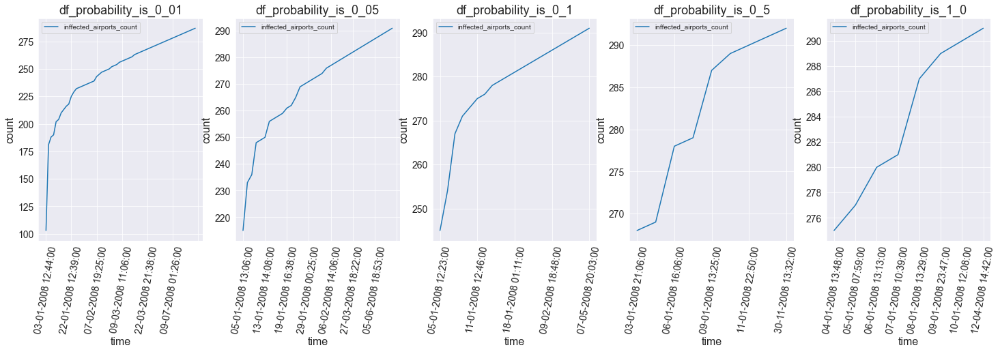

In [469]:
'''- Постройте графики числа зараженных городов в зависимости от времени для каждой из вероятностей.'''
fig, axs = plt.subplots(1, 5, figsize=(25,6))

for i in range(len(name_parts)):

    df_name = name_parts[i]
    df = df_dict[df_name]
    ax = axs[i]
    df.plot(x='time',
            y='inffected_airports_count',
            kind='line',
            ax=ax)
    ax.set_title(f'{df_name}')
    ax.tick_params(axis='both', labelsize=14)
    ax.set_xlabel('time', fontsize=16)
    ax.set_ylabel('count', fontsize=16)
    ax.set_title(name_parts[i], fontsize=18)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
plt.show()


## <center> 「 Часть 3. Может ли информация о сети помочь предсказать, кто будет заражен? 」</center>

In [ ]:
'''
По имеющемуся датасету вам нужно построить ненаправленный граф всех аэропортов,
используя относительное число перелетов между соседними аэропортами в качестве веса ребра.

Например, если из аэропорта А в аэропорт Б суммарно есть 5 рейсов, из Б в А 10 рейсов, а всего в сети 150 перелетов,
то вес ребра между А и Б должен быть равен (5+10)/150 = 0.1.
'''

In [14]:
'''По имеющемуся датасету вам нужно построить ненаправленный граф всех аэропортов'''
def modify_dataframe_to_graph(dataframe):
    graph = {}
    for row in dataframe.itertuples():
        origin = row.Origin
        dest = row.Dest
        if origin not in graph:
            graph[origin] = []
        graph[origin].append(dest)
    return graph

In [15]:
'''используя относительное число перелетов между соседними аэропортами в качестве веса ребра'''
def calculate_weight(graph):
    total_flights = 0
    adjacency_list = {}

    for node in graph:
        for neighbor in graph[node]:
            if node not in adjacency_list:
                adjacency_list[node] = {}
            if neighbor not in adjacency_list[node]:
                adjacency_list[node][neighbor] = 0
            adjacency_list[node][neighbor] += 1
            total_flights += 1

    for node in adjacency_list:
        for neighbor in adjacency_list[node]:
            if node not in adjacency_list[neighbor]:
                adjacency_list[neighbor][node] = 0
            edge_weight = (adjacency_list[node][neighbor] + adjacency_list[neighbor][node]) / total_flights
            adjacency_list[node][neighbor] = edge_weight
            adjacency_list[neighbor][node] = edge_weight

    return adjacency_list

In [16]:
time_sorted_graph = modify_dataframe_to_graph(time_sorted_df)

In [17]:
total_flights = calculate_weight(time_sorted_graph)

In [18]:
total_flights

{'Chicago_Midway_International_Airport': {'Kansas_City': 3.2355835044715844e-10,
  'Baltimore': 2.3438738699759986e-10,
  'Tampa': 1.8514562463489654e-10,
  'Detroit': 2.606241463911991e-10,
  'Philadelphia': 2.2039728352840346e-10,
  'Atlanta': 2.7116987788165713e-10,
  'Fort_Lauderdale': 1.3577629293964737e-10,
  'Orlando': 2.9736411416440776e-10,
  'Minneapolis': 1.1757640149643752e-10,
  'Denver': 3.64465583083532e-10,
  'Los_Angeles': 1.990932049932443e-10,
  'Jackson': 5.702349164800098e-11,
  'Las_Vegas': 3.1713736070901665e-10,
  'Raleigh_Durham': 1.1379184463091023e-10,
  'Miami': 1.1141055042338743e-11,
  'San_Antonio': 5.927721652297791e-11,
  'Nashville': 2.520344779997776e-10,
  'San_Diego': 1.4321783733815607e-10,
  'Hartford': 8.725742346137063e-11,
  'Phoenix': 2.3396215588911366e-10,
  'Islip': 1.195324645954741e-10,
  'Oakland': 1.440682995551285e-10,
  'Fort_Myers': 9.189244254387034e-11,
  'Salt_Lake_City': 8.432332881281578e-11,
  'Albuquerque': 6.170103384134931e-

In [19]:
del total_flights[np.nan]

In [20]:
'''
- Прогоните вашу симуляцию 50 раз, используя p=0.5 и стартовый аэропорт Allentown, каждый раз сохраняя результаты.
- Используя данные симуляций посчитайте медианное время до заражения каждого города.
'''

'\n- Прогоните вашу симуляцию 50 раз, используя p=0.5 и стартовый аэропорт Allentown, каждый раз сохраняя результаты.\n- Используя данные симуляций посчитайте медианное время до заражения каждого города.\n'

In [21]:
%%time
''' Прогоните вашу симуляцию 50 раз, используя p=0.5 и стартовый аэропорт Allentown, каждый раз сохраняя результаты. '''
bio_hazard_no_0_5_dict = modify_do_the_infection(time_sorted_df, 'Allentown', 0.5, dict(),  50)

NameError: name 'modify_do_the_infection' is not defined

In [278]:
bio_hazard_no_0_5_dict

{'Allentown': [1199174760.0,
  1199192340.00386,
  1199197800.00426,
  1199204760.00493,
  1199147280.00486,
  1199146500.0036,
  1199277660.00423,
  1199291580.00381,
  1199295000.0032,
  1199306400.00274,
  1199308620.00294,
  1199314860.00431,
  1199316960.00142,
  1199375160.00149,
  1199394780.00454,
  1199446500.00298,
  1199451960.00214,
  1199457960.00438,
  1199462640.00135,
  1199471640.00425,
  1199481780.00368,
  1199483640.00146,
  1199486700.00234,
  1199487540.00295,
  1199533620.00327,
  1199532180.0028,
  1199539560.00187,
  1199547240.00229,
  1199550480.0018,
  1199552880.00345,
  1199563020.00266,
  1199568540.00337,
  1199567820.00421,
  1199573160.00297,
  1199491980.00165,
  1199631120.00147,
  1199639760.00489,
  1199636940.00106,
  1199640240.00286,
  1199650800.00148,
  1199659320.00282,
  1199656020.001,
  1199659860.0043,
  1199706540.00228,
  1199717340.00326,
  1199730060.00175,
  1199743500.00422,
  1199743920.00396,
  1199750040.00194,
  1199747400.00248

In [279]:
bio_hazard_no_0_5_df = pd.DataFrame.from_dict(bio_hazard_no_0_5_dict)

In [280]:
# bio_hazard_no_0_5_df.to_csv('bio_hazard_no_0_5_df.csv', index=False)

In [5]:
# bio_hazard_no_0_5_df = pd.read_csv('bio_hazard_no_0_5_df.csv')

In [23]:
''' Используя данные симуляций посчитайте медианное время до заражения каждого города. '''
medians = {}
for column in bio_hazard_no_0_5_df.columns:
    medians[column] = bio_hazard_no_0_5_df[column].median()

In [24]:
''' медианное время до заражения каждого города. '''
medians

In [26]:
'''
Теперь используя построенный вами граф, для каждого города посчитайте его коэффициент кластеризации (nx.clustering),
степень (nx.degree) и центральность (nx.betweenness_centrality).
'''
G = nx.from_dict_of_lists(total_flights)

In [27]:
G.remove_nodes_from(n for n in G.nodes() if n in ["nan","NaN", np.nan])

RuntimeError: dictionary changed size during iteration

In [28]:
len(G)

293

In [29]:
'''коэффициент кластеризации (nx.clustering)'''
clustering_coeff = nx.clustering(G)

In [30]:
clustering_coeff

{'Chicago_Midway_International_Airport': 0.5527603074772887,
 'Denver': 0.2319468906652215,
 'Portland': 0.5545893719806764,
 'Atlanta': 0.14998174516246807,
 'Oakland': 0.6723484848484849,
 'Cleveland': 0.4807017543859649,
 'Chicago_OHare_International_Airport': 0.1867737364194615,
 'Las_Vegas': 0.37094017094017095,
 'Salt_Lake_City': 0.21523341523341524,
 'San_Jose': 0.7513227513227513,
 'Washington_Dulles_International_Airport': 0.462111801242236,
 'Sacramento': 0.5915915915915916,
 'Seattle': 0.5337662337662338,
 'New_York_John_F_Kennedy_International_Airport': 0.42655935613682094,
 'Cincinnati': 0.2643734643734644,
 'San_Francisco': 0.3490683229813665,
 'Tucson': 0.7379032258064516,
 'Reno': 0.8181818181818182,
 'Miami': 0.6921768707482994,
 'Honolulu': 0.7681159420289855,
 'Phoenix': 0.3714733542319749,
 'Los_Angeles': 0.33963227783452504,
 'Ontario': 0.6515151515151515,
 'Albuquerque': 0.6512820512820513,
 'Anchorage': 0.3374384236453202,
 'Fort_Lauderdale': 0.5384150030248034,


In [31]:
'''степень (nx.degree)'''
degrees = nx.degree(G)

In [32]:
sorted([degrees[node] for node in medians.keys()])

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 13,
 13,
 13,
 13,
 13,
 13,
 14,
 14,
 15,
 15,
 15,
 15,
 15,
 16,
 16,
 16,
 16,
 16,
 16,
 17,
 17,
 18,
 18,
 18,
 18,
 18,
 18,
 19,
 20,
 21,
 21,
 21,
 22,
 22,
 22,
 22,
 22,
 23,
 23,
 24,
 26,
 27,
 28,
 28

In [33]:
degrees_series = pd.Series(dict(degrees)).sort_index()

In [34]:
list(degrees_series)

[1,
 1,
 3,
 13,
 18,
 40,
 3,
 11,
 7,
 29,
 9,
 4,
 7,
 9,
 166,
 3,
 4,
 53,
 9,
 65,
 8,
 3,
 9,
 1,
 1,
 1,
 1,
 4,
 1,
 33,
 2,
 6,
 18,
 66,
 10,
 4,
 1,
 1,
 22,
 16,
 13,
 2,
 2,
 4,
 3,
 11,
 3,
 21,
 80,
 3,
 7,
 54,
 146,
 1,
 111,
 76,
 2,
 2,
 21,
 10,
 36,
 2,
 4,
 2,
 134,
 18,
 16,
 9,
 3,
 122,
 22,
 116,
 2,
 1,
 1,
 2,
 4,
 18,
 1,
 1,
 2,
 7,
 7,
 6,
 8,
 22,
 1,
 12,
 1,
 58,
 35,
 3,
 6,
 12,
 1,
 3,
 1,
 7,
 16,
 6,
 12,
 19,
 13,
 7,
 5,
 1,
 1,
 5,
 14,
 35,
 10,
 3,
 3,
 1,
 24,
 1,
 113,
 33,
 1,
 15,
 3,
 2,
 39,
 1,
 1,
 9,
 1,
 13,
 8,
 40,
 7,
 18,
 6,
 6,
 52,
 4,
 2,
 3,
 2,
 2,
 15,
 1,
 13,
 2,
 2,
 3,
 1,
 5,
 2,
 91,
 2,
 1,
 1,
 15,
 10,
 9,
 21,
 20,
 1,
 89,
 29,
 7,
 1,
 1,
 16,
 18,
 3,
 3,
 11,
 2,
 79,
 1,
 49,
 7,
 50,
 124,
 1,
 5,
 5,
 3,
 10,
 3,
 10,
 3,
 8,
 3,
 11,
 3,
 51,
 1,
 41,
 71,
 66,
 90,
 8,
 6,
 2,
 30,
 3,
 33,
 31,
 27,
 33,
 89,
 1,
 12,
 2,
 4,
 2,
 2,
 9,
 8,
 2,
 59,
 88,
 2,
 36,
 1,
 4,
 46,
 22,
 45,
 4,
 2,
 5,
 2

In [35]:
'''центральность (nx.betweenness_centrality)'''
betweenness_centrality = nx.betweenness_centrality(G)

In [36]:
betweenness_centrality

{'Chicago_Midway_International_Airport': 0.002097751018704521,
 'Denver': 0.06669747987986369,
 'Portland': 0.009490215800465333,
 'Atlanta': 0.183862431484972,
 'Oakland': 0.0007830729636159351,
 'Cleveland': 0.005134578272817216,
 'Chicago_OHare_International_Airport': 0.08301417706052107,
 'Las_Vegas': 0.019948673440302055,
 'Salt_Lake_City': 0.11743637375060921,
 'San_Jose': 0.0007230674700448957,
 'Washington_Dulles_International_Airport': 0.005539215203916905,
 'Sacramento': 0.0047736470422067075,
 'Seattle': 0.03922659995529132,
 'New_York_John_F_Kennedy_International_Airport': 0.013000009274819768,
 'Cincinnati': 0.039974747560342715,
 'San_Francisco': 0.045150062749669206,
 'Tucson': 0.0005659743940545934,
 'Reno': 0.0002705213108434696,
 'Miami': 0.002243067914395351,
 'Honolulu': 0.004713488212701857,
 'Phoenix': 0.03239182811582689,
 'Los_Angeles': 0.05243855749139744,
 'Ontario': 0.0008119855629184818,
 'Albuquerque': 0.0030131418033284515,
 'Anchorage': 0.0767027717352705

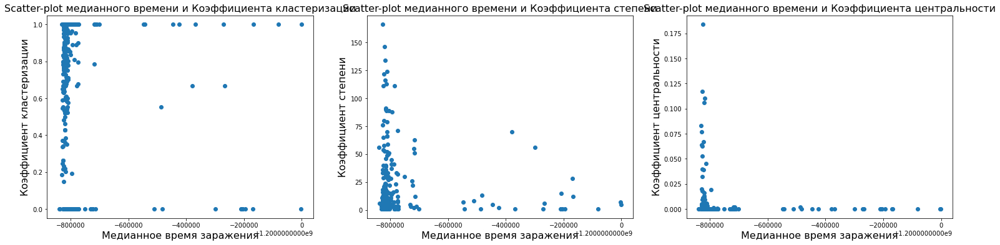

In [57]:
''' Наконец, постройте scatter-plot-ы для медианного времени заражения и каждой из рассчитанных выше метрик. '''
x_values = list(medians.values())
y_values = [list(clustering_coeff.values()), list(degrees_series), list(betweenness_centrality.values())]
ylabel = ['Коэффициент кластеризации', 'Коэффициент степени', 'Коэффициент центральности']

fig, axs = plt.subplots(1, 3, figsize=(26, 6))

for i in range(3):
    axs[i].scatter(x_values, y_values[i])
    axs[i].set_title(f'Scatter-plot медианного времени и {ylabel[i].split()[0]}a {ylabel[i].split()[1]}', fontsize=16)
    axs[i].set_xlabel('Медианное время заражения', fontsize=16)
    axs[i].set_ylabel(ylabel[i], fontsize=16)

plt.show()

In [ ]:
'''Также посчитайте коэффициент корреляции Спирмана между этими показателями и попробуйте проинтерпретировать полученные результаты.'''

In [39]:
coef, p_value = spearmanr(medians, clustering_coeff)

In [40]:
coef

nan

In [41]:
p_value

nan

In [54]:
coef, p_value = spearmanr(medians, dict(degrees))

In [55]:
coef

nan

In [56]:
p_value

nan

In [47]:
coef, p_value = spearmanr(medians, betweenness_centrality)

In [48]:
coef

nan

In [49]:
p_value

nan

In [ ]:
'''
Какая из метрик графа сильнее всего скоррелирована со временем заражения? Почему?
Даже при неработающем коэффициент корреляции Спирмана по графикам можно наблюдать отсутствие корреляции со временем заражения.
'''

#  Graph Testing part
# ========================================================================

In [358]:
th_degree_centrality = degree_centrality_counts.most_common(100)[-1][1]

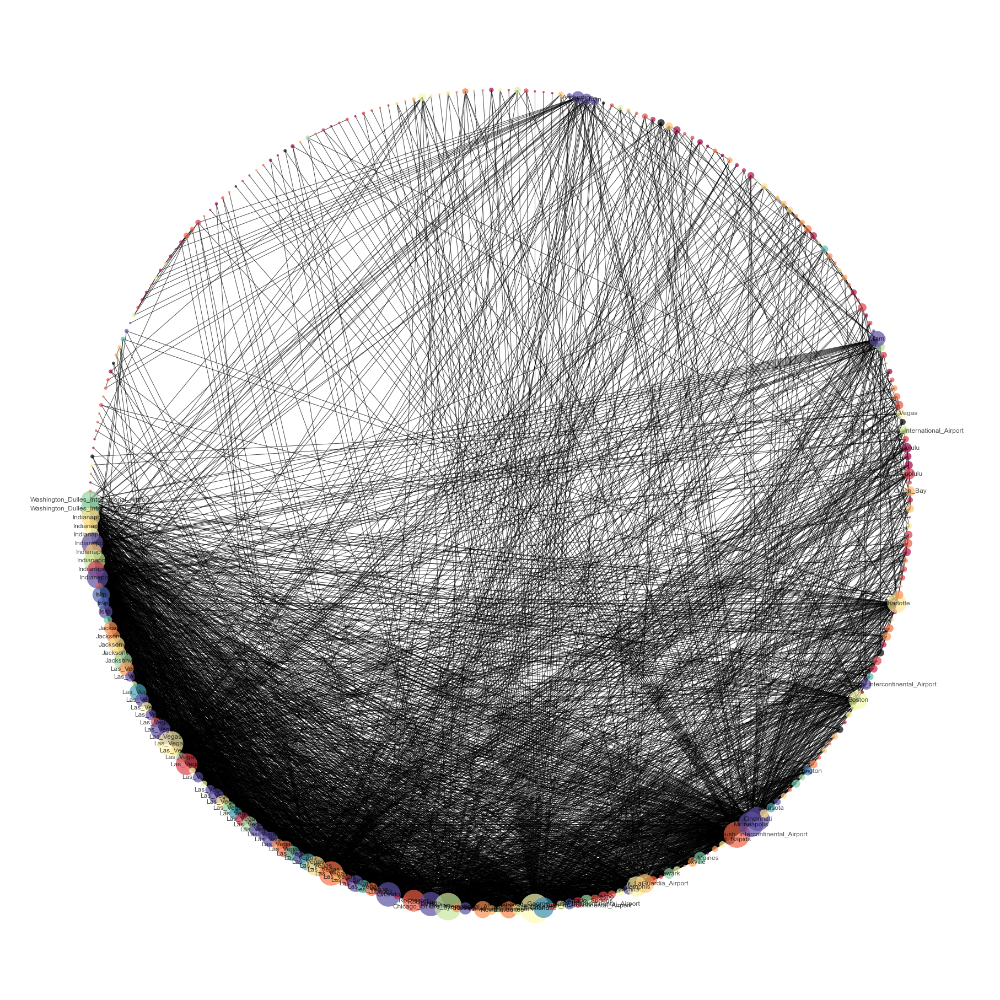

In [359]:
nx.draw_shell(
    G_full,
    node_color=clrs_full,
    with_labels=True,
    alpha=0.7,
    labels={n[0]: n[1]['name'] for n in G_full.nodes.data() if degree_centrality[n[0]] > th_degree_centrality},
    node_size=np.array(list(degree_centrality.values())) * 5000,
    linewidths=0.1,
)

In [360]:
closeness_centrality = nx.closeness_centrality(G_full)

closeness_centrality_counts = Counter(closeness_centrality)
for k, v in closeness_centrality_counts.most_common(10):
    print(G_full.nodes[k]['name'], v)

Cleveland 0.6892523364485982
Chicago_OHare_International_Airport 0.6584821428571429
Houston_George_Bush_Intercontinental_Airport 0.6413043478260869
Las_Vegas 0.6316916488222698
Minneapolis 0.6276595744680851
Las_Vegas 0.615866388308977
Orlando 0.6145833333333334
Dayton 0.6133056133056133
Cincinnati 0.609504132231405
Indianapolis 0.5864811133200796


In [361]:
th_closeness_centrality = closeness_centrality_counts.most_common(100)[-1][1]

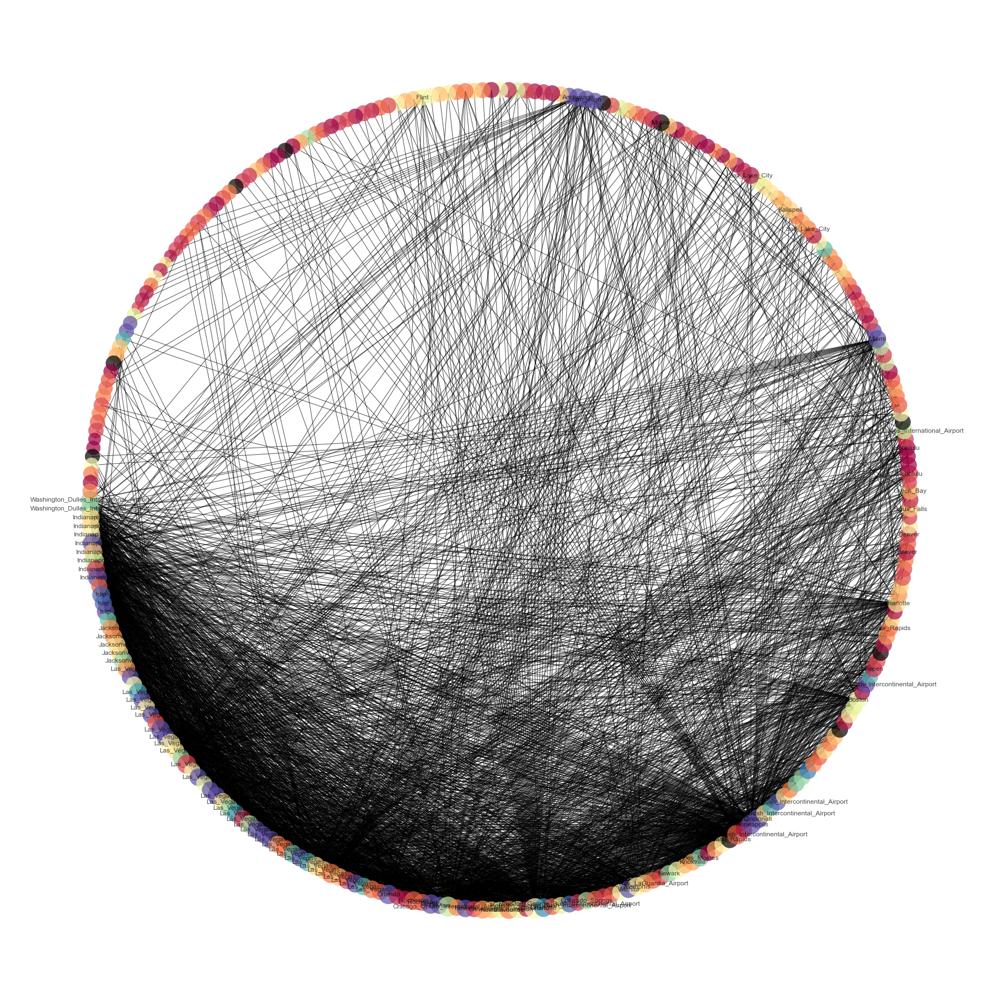

In [362]:
nx.draw_shell(
    G_full,
    node_color=clrs_full,
    with_labels=True,
    alpha=0.7,
    labels={n[0]: n[1]['name'] for n in G_full.nodes.data() if closeness_centrality[n[0]] > th_closeness_centrality},
    node_size=np.array(list(closeness_centrality.values())) * 2000,
    linewidths=0.1,
)